In [1]:
import warnings
warnings.filterwarnings("ignore", message="numpy.dtype size changed")
warnings.filterwarnings("ignore", message="numpy.ufunc size changed")

import os, sys
import numpy as np
from models import *
import torch
import torch.optim as optim
import torch.nn as nn
import time

In [5]:
print sys.path

['', '/users/visics/kkelchte/tensorflow_1.8/lib/python2.7/site-packages', '/esat/opal/kkelchte/docker_home/tensorflow/pytorch_pilot/pilot', '/esat/opal/kkelchte/docker_home/tensorflow/pytorch-cnn-visualizations/src', '/users/visics/kkelchte/tensorflow_1.8/lib/python27.zip', '/users/visics/kkelchte/tensorflow_1.8/lib64/python2.7', '/users/visics/kkelchte/tensorflow_1.8/lib64/python2.7/plat-linux2', '/users/visics/kkelchte/tensorflow_1.8/lib64/python2.7/lib-tk', '/users/visics/kkelchte/tensorflow_1.8/lib64/python2.7/lib-old', '/users/visics/kkelchte/tensorflow_1.8/lib64/python2.7/lib-dynload', '/usr/lib64/python2.7', '/usr/lib/python2.7', '/usr/lib64/python2.7/lib-tk', '/users/visics/kkelchte/tensorflow_1.8/lib/python2.7/site-packages/IPython/extensions', '/esat/opal/kkelchte/docker_home/.ipython']


In [2]:
# load torch vision network
pretrained_net = alex_net.Net(3,True)
imsize=pretrained_net.default_image_size


In [3]:
# load pretrained checkpoint
checkpoint_path='/esat/opal/kkelchte/docker_home/tensorflow/log/log_neural_architectures/alex_net/esatv3_expert_200K/ref/1/seed_0'
# checkpoint_path='/esat/opal/kkelchte/docker_home/tensorflow/log/alex_net_pretrained/esatv3_expert_200K/1/seed_0'
# checkpoint_path='/esat/opal/kkelchte/docker_home/tensorflow/log/alex_net_finetune/1/seed_0'
checkpoint=torch.load(checkpoint_path+'/my-model')
pretrained_net.load_state_dict(checkpoint['model_state_dict'], strict=True)


In [4]:
# load example images
import skimage.io as sio
import skimage.transform as sm
import matplotlib.pyplot as plt
# imdir='/esat/opal/kkelchte/docker_home/pilot_data/visualization_images'
imdir='/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB'

all_controls=[]
with open(imdir+'/../control_info.txt','r') as f:
    all_controls=[(int(l.strip().split(' ')[0]), float(l.strip().split(' ')[-1])) for l in f.readlines()[2:]]
images=[]
controls=[]
impaths=[]
for imgfile in sorted([ imdir+'/'+f for f in os.listdir(imdir) if f.endswith('jpg')]):
    # for imgfile in [ imdir+'/'+f for f in os.listdir(imdir) if f.endswith('jpg')]:
    print imgfile
    try:
        img_index=int(imgfile.split('/')[-1].split('.')[0])
        ctr=[c[1] for c in all_controls if c[0]==img_index][0]
    #     print img_index, ctr
        img = sio.imread(imgfile)
    #     plt.imshow(img)
    #     plt.show()
        # for pytorch: swap channels from last to first dimension
    #     img = np.swapaxes(img,1,2)
    #     img = np.swapaxes(img,0,1)
        img=img.transpose(2,0,1)
        scale_height = int(np.floor(img.shape[1]/imsize[1]))
        scale_width = int(np.floor(img.shape[2]/imsize[2]))
        img = img[:,::scale_height,::scale_width]
        img = sm.resize(img,imsize,mode='constant').astype(np.float16)
        img -= 0.5
    except:
        pass
    else:
        images.append(img)
        controls.append(ctr)
        impaths.append(imgfile)
#     if len(images)==5: break
    

/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000005.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000009.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000011.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000013.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000015.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000017.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000019.jpg


/users/visics/kkelchte/tensorflow_1.8/lib/python2.7/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000021.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000023.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000025.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000027.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000029.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000031.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000033.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000035.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000037.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000039.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000041.jpg
/esat/opal/kkelchte/d

/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000225.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000227.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000229.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000231.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000233.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000235.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000237.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000239.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000241.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000243.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000245.jpg
/esat/opal/kkelchte/d

/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000423.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000425.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000427.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000429.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000431.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000433.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000435.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000437.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000439.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000441.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000443.jpg
/esat/opal/kkelchte/d

/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000609.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000611.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000613.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000615.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000617.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000619.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000621.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000623.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000625.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000627.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000629.jpg
/esat/opal/kkelchte/d

/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000807.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000809.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000811.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000813.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000815.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000817.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000819.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000821.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000823.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000825.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000000827.jpg
/esat/opal/kkelchte/d

/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001005.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001007.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001009.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001011.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001013.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001015.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001017.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001019.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001021.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001023.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001025.jpg
/esat/opal/kkelchte/d

/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001203.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001205.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001207.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001209.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001211.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001213.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001215.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001217.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001219.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001221.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001223.jpg
/esat/opal/kkelchte/d

/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001403.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001405.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001407.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001409.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001411.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001413.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001415.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001417.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001419.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001421.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001423.jpg
/esat/opal/kkelchte/d

/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001603.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001605.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001607.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001609.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001611.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001613.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001615.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001617.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001619.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001621.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001623.jpg
/esat/opal/kkelchte/d

/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001797.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001799.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001801.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001803.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001805.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001807.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001809.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001811.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001813.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001815.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001817.jpg
/esat/opal/kkelchte/d

/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001997.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001999.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002001.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002003.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002005.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002007.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002009.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002011.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002013.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002015.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002017.jpg
/esat/opal/kkelchte/d

/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002191.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002193.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002195.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002197.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002199.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002201.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002203.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002205.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002207.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002209.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002210.jpg
/esat/opal/kkelchte/d

/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002391.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002393.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002395.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002397.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002399.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002401.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002403.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002405.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002407.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002409.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002411.jpg
/esat/opal/kkelchte/d

/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002589.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002591.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002593.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002595.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002597.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002599.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002601.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002603.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002605.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002607.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002609.jpg
/esat/opal/kkelchte/d

/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002787.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002789.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002791.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002793.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002795.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002797.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002799.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002801.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002803.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002805.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002807.jpg
/esat/opal/kkelchte/d

/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002983.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002985.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002987.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002989.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002991.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002993.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002995.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002997.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000002999.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003001.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003003.jpg
/esat/opal/kkelchte/d

/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003183.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003185.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003187.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003189.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003191.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003193.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003195.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003197.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003199.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003201.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003203.jpg
/esat/opal/kkelchte/d

/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003383.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003385.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003387.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003389.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003391.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003393.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003395.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003397.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003399.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003401.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003403.jpg
/esat/opal/kkelchte/d

/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003581.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003582.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003585.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003587.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003589.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003591.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003593.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003595.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003597.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003599.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003601.jpg
/esat/opal/kkelchte/d

/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003781.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003783.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003785.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003787.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003789.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003791.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003793.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003795.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003797.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003799.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003801.jpg
/esat/opal/kkelchte/d

/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003981.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003983.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003985.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003987.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003989.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003991.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003993.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003995.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003997.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000003999.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004001.jpg
/esat/opal/kkelchte/d

/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004181.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004183.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004185.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004187.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004189.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004191.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004193.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004195.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004197.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004199.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004201.jpg
/esat/opal/kkelchte/d

/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004375.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004377.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004379.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004381.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004383.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004385.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004387.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004389.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004391.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004393.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004395.jpg
/esat/opal/kkelchte/d

/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004563.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004565.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004567.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004569.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004571.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004573.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004575.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004577.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004579.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004581.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004583.jpg
/esat/opal/kkelchte/d

/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004757.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004759.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004761.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004763.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004765.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004767.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004769.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004771.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004773.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004775.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004777.jpg
/esat/opal/kkelchte/d

/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004943.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004945.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004947.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004949.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004951.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004953.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004955.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004957.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004959.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004961.jpg
/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000004963.jpg
/esat/opal/kkelchte/d

In [5]:
# find hard example where difference between network and target is large:
m = nn.Softmax(dim=1)
y_pred=pretrained_net(torch.from_numpy(np.asarray(images)).type(torch.float32))
output = m(y_pred)
quick_translate={round(0.0,1):[0,1,0],
                round(-0.9,1):[1,0,0],
                round(0.9,1):[0,0,1]}
targets=[]
for c in controls:
    targets.append(quick_translate[c])
hard_example_indices=np.sum(((output.detach().numpy()-np.asarray(targets))**2),axis=1).argsort()[::-1][:10]
hard_images=[]
hard_targets=[]
hard_image_paths=[]
for i in list(hard_example_indices):
    hard_images.append(images[i])
    hard_targets.append(targets[i])
    hard_image_paths.append(impaths[i])

In [7]:
inputs=np.asarray(hard_images)
y_pred=pretrained_net(torch.from_numpy(inputs).type(torch.float32))
output = m(y_pred).detach().numpy()
for i in range(len(hard_targets)):
    print(hard_targets[i], output[i])


([0, 1, 0], array([4.070277e-04, 7.402656e-03, 9.921903e-01], dtype=float32))
([0, 1, 0], array([3.1651645e-05, 1.0611447e-02, 9.8935694e-01], dtype=float32))
([0, 1, 0], array([0.0097686 , 0.01255826, 0.9776732 ], dtype=float32))
([0, 1, 0], array([0.01097765, 0.01302631, 0.9759961 ], dtype=float32))
([0, 1, 0], array([0.00115181, 0.02435732, 0.9744908 ], dtype=float32))
([1, 0, 0], array([0.01241008, 0.02587919, 0.9617107 ], dtype=float32))
([0, 1, 0], array([0.00112032, 0.02510265, 0.973777  ], dtype=float32))
([1, 0, 0], array([0.01670328, 0.02441454, 0.95888215], dtype=float32))
([0, 1, 0], array([1.3942487e-04, 3.3999588e-02, 9.6586096e-01], dtype=float32))
([0, 1, 0], array([0.0013655 , 0.03412697, 0.96450746], dtype=float32))


In [11]:
print pretrained_net.network

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (classifier): Sequential(
    (0): Dropout(p=0.5)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
    (2): ReLU(inplace)
    (3): Dropout(p=0.5)
    (4): Linear(in_features=4096, out_feature

In [17]:
# Play around with grad CAM
import gradcam
from PIL import Image
from misc_functions import get_example_params, save_class_activation_images
img_index=0
# img_path='/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001159.jpg'
img_path=hard_image_paths[img_index]
original_image = Image.open(img_path).convert('RGB')
original_image = original_image.resize((224,224),Image.NEAREST)

# for target_layer in range(13):
for target_layer in [12]:
    print pretrained_net.network.features[target_layer]
    grad_cam = gradcam.GradCam(pretrained_net.network, target_layer=target_layer)
    # Generate cam mask
    for target_class in [0,1,2]:
#     for target_class in [0]:
        inputs=hard_images[0]
        prep_img=torch.from_numpy(np.expand_dims(inputs,0)).type(torch.float32)
        cam = grad_cam.generate_cam(prep_img, target_class)    
        file_name_to_export='/users/visics/kkelchte/blogs/kkelchte.github.io/imgs/19-04/19-04-04_gradcam_act_{0}'.format(target_class)
        save_class_activation_images(original_image, cam, file_name_to_export)
    #     img=hard_images[0]+0.5
    #     img=img.transpose(1,2,0).astype(np.float32)
    #     plt.imshow(cam)
    #     plt.axis('off')
#         plt.imshow(cam)
#         plt.axis('off')
#         plt.savefig('/users/visics/kkelchte/blogs/kkelchte.github.io/imgs/19-04-04_CAM_{0}.jpg'.format(target_layer),bbox_inches='tight')
#         plt.show()

MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
255
()
255
()
255
A
(1, 224, 224)
B
(3, 224, 224)
255
()
255
()
255
A
(1, 224, 224)
B
(3, 224, 224)
255
()
255
()
255
A
(1, 224, 224)
B
(3, 224, 224)


In [64]:
from PIL import Image
from misc_functions import get_example_params, save_class_activation_images
img_path='/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001159.jpg'

# original_image= np.asarray(Image.open(img_path).convert('RGB'))
original_image = Image.open(img_path).convert('RGB')
original_image = original_image.resize((224,224),PIL.Image.NEAREST)
# original_image.resize((224,224), Image.ANTIALIAS)
# original_image = sm.resize(original_image,(224,224,3),mode='constant')

print original_image.size
print cam.shape
# img=hard_images[0]+0.5
# original_image=255*img.transpose(1,2,0).astype(np.float32)
# original_image=original_image.astype(np.uint16)
file_name_to_export='/users/visics/kkelchte/blogs/kkelchte.github.io/imgs/19-04/19-04-04_gradcam'
save_class_activation_images(original_image, cam, file_name_to_export)
    

(224, 224)
(224, 224)
255
()
255
()
255
A
(1, 224, 224)
B
(3, 224, 224)


/esat/opal/kkelchte/docker_home/pilot_data/esatv3_expert/00001_esatv3/RGB/0000001157.jpg


(-0.5, 223.5, 223.5, -0.5)

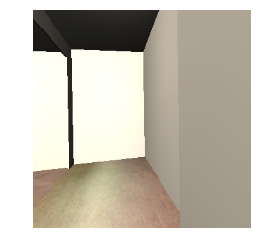

In [6]:
img=hard_images[0]+0.5
print hard_image_paths[0]
plt.imshow(img.transpose(1,2,0).astype(np.float32))
plt.axis('off')
# plt.savefig('/users/visics/kkelchte/blogs/kkelchte.github.io/imgs/19-04-04_original_image.jpg',bbox_inches='tight')
# plt.show()

In [57]:
#get importance filters from one image
gradients=[0 for p in pretrained_net.parameters()]
inputs=hard_images[0]
pretrained_net.zero_grad()
y_pred=pretrained_net(torch.from_numpy(np.expand_dims(inputs,0)).type(torch.float32))
torch.norm(y_pred, 2, dim=1).backward()
#torch.sum(torch.norm(y_pred, 2, dim=1)).backward()
for pindex, p in enumerate(pretrained_net.parameters()):
    g=p.grad.data.clone().detach().numpy()
    gradients[pindex]+=np.abs(g)

#Calculate importance weights for each filter, rather than parameter:
filter_omegas=[]
for i,g in enumerate(gradients):
    if i%2==0: 
        filter_omegas.append([np.mean(f) for f in g])

In [54]:
print len(gradients)

16


In [16]:
# Calculate importance weights on all hard data
gradients=[0 for p in pretrained_net.parameters()]
# images=images[:100]
inputs=hard_images[:1]
for xi, sx in enumerate(inputs):
    if xi%10 == 0: print("image {0}/{1}".format(xi, len(images)))
    pretrained_net.zero_grad()
    y_pred=pretrained_net(torch.from_numpy(np.expand_dims(sx,0)).type(torch.float32))
    torch.norm(y_pred, 2, dim=1).backward()
    #torch.sum(torch.norm(y_pred, 2, dim=1)).backward()
    for pindex, p in enumerate(pretrained_net.parameters()):
        g=p.grad.data.clone().detach().numpy()
        gradients[pindex]+=np.abs(g)/len(images)

#Calculate importance weights for each filter, rather than parameter:
filter_omegas=[]
for i,g in enumerate(gradients):
    if i%2==0: 
        filter_omegas.append([np.mean(f) for f in g])

image 0/2506


layer: 0 shape: (64, 3, 11, 11) omega_max: 196.3465271 omega_min: 0.0
layer: 0 shape: (64,) omega_max: 1273.9375 omega_min: 0.00216146884486
layer: 1 shape: (192, 64, 5, 5) omega_max: 788.307983398 omega_min: 0.0
layer: 1 shape: (192,) omega_max: 457.884735107 omega_min: 0.0147643405944
layer: 2 shape: (384, 192, 3, 3) omega_max: 444.709228516 omega_min: 0.0
layer: 2 shape: (384,) omega_max: 175.394042969 omega_min: 0.0
layer: 3 shape: (256, 384, 3, 3) omega_max: 489.743835449 omega_min: 0.0
layer: 3 shape: (256,) omega_max: 264.28692627 omega_min: 0.00933732185513
layer: 4 shape: (256, 256, 3, 3) omega_max: 428.080322266 omega_min: 0.0
layer: 4 shape: (256,) omega_max: 221.248733521 omega_min: 0.000510344165377
layer: 5 shape: (4096, 9216) omega_max: 64.7949523926 omega_min: 0.0
layer: 5 shape: (4096,) omega_max: 14.2663326263 omega_min: 0.0
layer: 6 shape: (4096, 4096) omega_max: 221.314758301 omega_min: 0.0
layer: 6 shape: (4096,) omega_max: 34.1425704956 omega_min: 0.0
layer: 7 sha

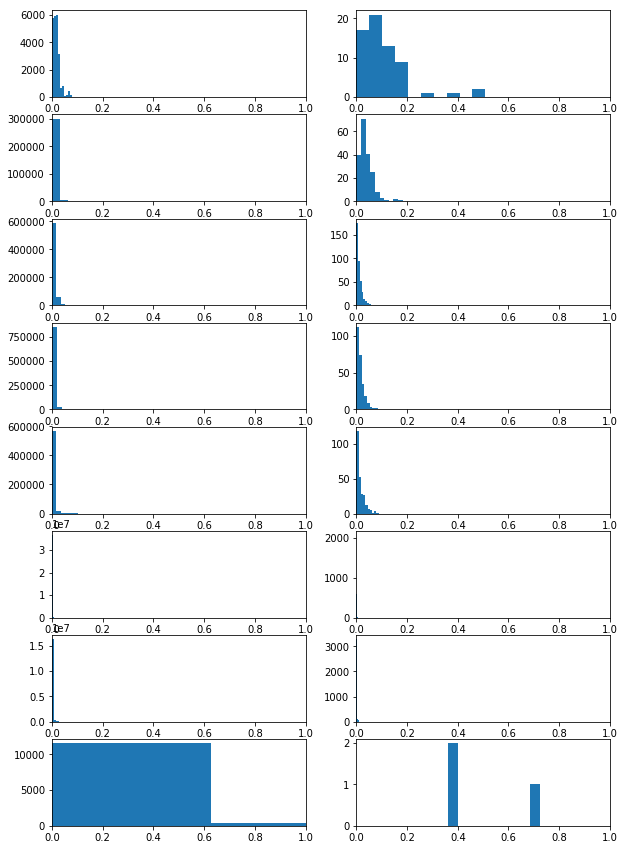

In [24]:
fig,ax = plt.subplots(8,2, figsize=(10,15))
for i,g in enumerate(gradients):
    print("layer: {0} shape: {1} omega_max: {2} omega_min: {3}".format(i/2,g.shape,np.amax(g),np.amin(g)))
    ax[i/2,i%2].hist(g.flatten()/len(images))
    ax[i/2,i%2].set_xlim(0, 1)
# plt.show()
plt.savefig('./omegas_imgnetpretrained.png', bbox_inches='tight')

64


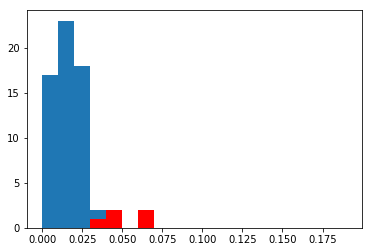

192


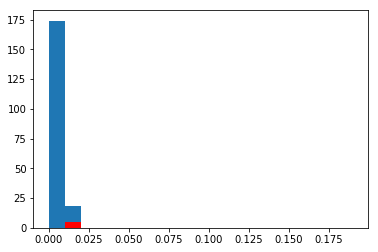

384


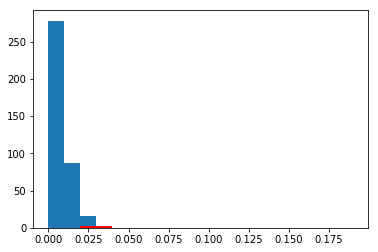

256


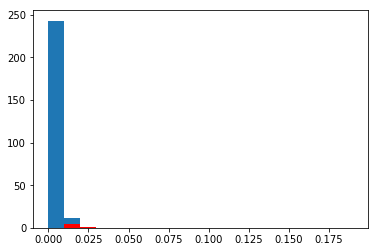

256


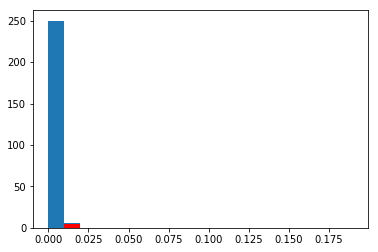

4096


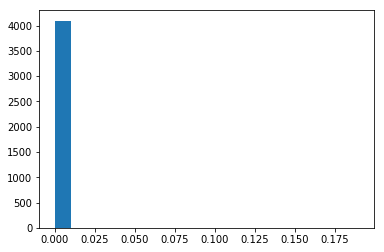

4096


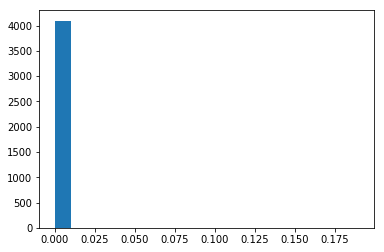

3


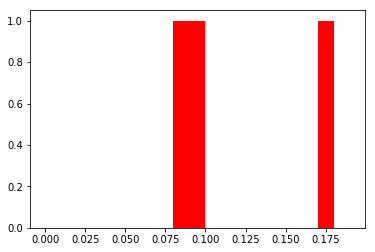

In [78]:
for f in filter_omegas:
    print len(f)
    bins=np.arange(0,0.2,0.01)
    plt.hist(f,bins)
    plt.hist(sorted(f)[-5:],bins,color='r')
    plt.show()

In [18]:
from torch.nn import ReLU
from misc_functions import (get_example_params,
                            convert_to_grayscale,
                            save_gradient_images,
                            get_positive_negative_saliency)
# from vanilla_backprop import VanillaBackprop
from layer_activation_with_guided_backprop import GuidedBackprop


tensor([[-3.4512, -0.5505,  4.3476]], grad_fn=<AddmmBackward>) [0, 1, 0]


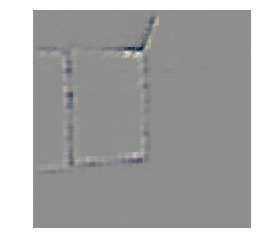

In [116]:
# Get output saliency map of hard input image
from guided_backprop import GuidedBackprop
input_index=0
inputs=torch.from_numpy(np.expand_dims(hard_images[input_index],0)).type(torch.FloatTensor)
inputs.requires_grad=True
BP = GuidedBackprop(pretrained_net.network)
saliency_maps=[]
# fig,ax = plt.subplots(len(layer_indices),K, figsize=(10,15))
plt_index=0
print pretrained_net(inputs), hard_targets[input_index]
for target in [0]:
    # Generate gradients
    gradient = BP.generate_gradients(inputs, target)
    gradient = gradient - gradient.min()
    gradient /= gradient.max()
    plt.imshow(gradient.transpose(1,2,0))
    plt.axis('off')
    plt.savefig('/users/visics/kkelchte/blogs/kkelchte.github.io/imgs/19-04-04_saliency_output_scratch_right.jpg',bbox_inches='tight')
    plt.show()

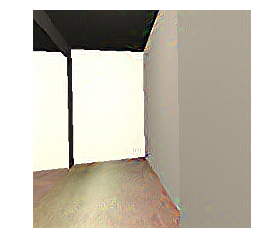

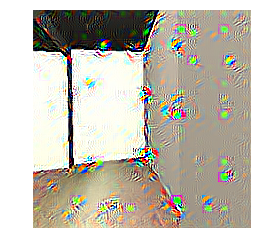

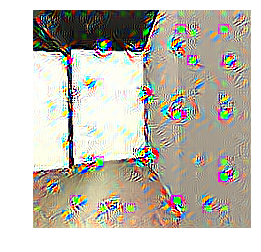

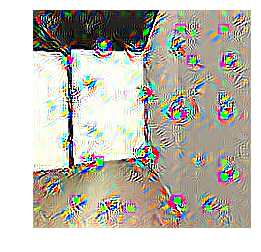

In [131]:
# Apply gradients to input image multiple times
# Get output saliency map of hard input image
from guided_backprop import GuidedBackprop
inputs=torch.from_numpy(np.expand_dims(hard_images[0],0)).type(torch.FloatTensor)
inputs.requires_grad=True
BP = GuidedBackprop(pretrained_net.network)
# fig,ax = plt.subplots(len(layer_indices),K, figsize=(10,15))
plt_index=0
N=16
for i in range(N):
    # Generate gradients
    gradient = BP.generate_gradients(inputs, 1)
    img=inputs.detach().numpy()
    img+=10*gradient
    inputs=torch.from_numpy(img).type(torch.FloatTensor)
    inputs.requires_grad=True
    if i%5==0:
#         img-=np.amin(img)
#         img/=np.amax(img)
        img=img+0.5
        plt.imshow(img[0].transpose(1,2,0))
        plt.axis('off')
        plt.savefig('/users/visics/kkelchte/blogs/kkelchte.github.io/imgs/19-04-04_dream_finetune_{0}.jpg'.format(int(i)),bbox_inches='tight')
        plt.show()

In [71]:
inputs=torch.from_numpy(np.expand_dims(hard_images[0],0)).type(torch.FloatTensor)
print(np.amin(inputs.detach().numpy()))
print hard_images[0].shape


-0.45922852
(3, 224, 224)


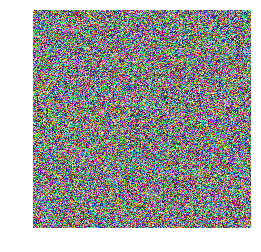

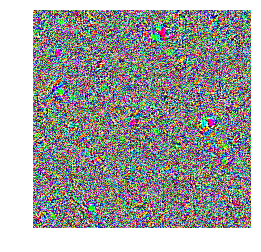

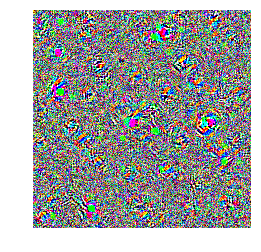

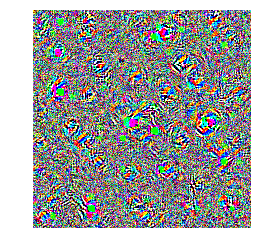

In [132]:
# Apply gradients to input image multiple times
# Get output saliency map of hard input image
from guided_backprop import GuidedBackprop
# inputs=np.expand_dims(hard_images[0],0)
# inputs=np.zeros((1,3,224,224)).astype(np.float16)
inputs=np.random.uniform(low=-0.5, high=0.5, size=(1,3,224,224)).astype(np.float16)
inputs=torch.from_numpy(inputs).type(torch.FloatTensor)
inputs.requires_grad=True
BP = GuidedBackprop(pretrained_net.network)
N=17
for i in range(N):
    # Generate gradients
    gradient = BP.generate_gradients(inputs, 1)
    img=inputs.detach().numpy()
    img+=10*gradient
    inputs=torch.from_numpy(img).type(torch.FloatTensor)
    inputs.requires_grad=True
    if i%5==0:
#         img-=np.amin(img)
#         img/=np.amax(img)
        img=img+0.5
        plt.imshow(img[0].transpose(1,2,0))
        plt.axis('off')
        #         plt.savefig('/users/visics/kkelchte/blogs/kkelchte.github.io/imgs/19-04-04_dream_{0}.jpg'.format(int(i/25)),bbox_inches='tight')
        plt.show()
    

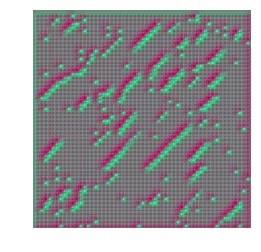

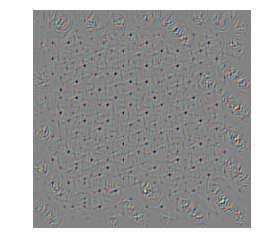

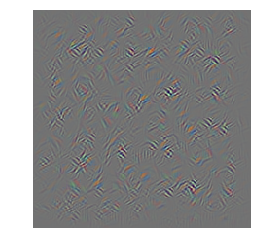

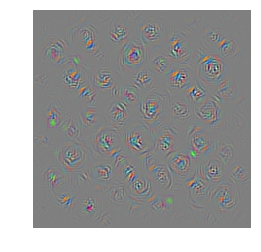

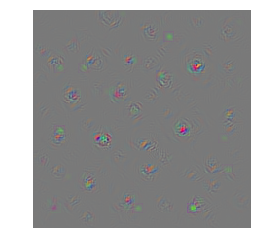

In [157]:
# Apply gradients to input image multiple times
# Get output saliency map of hard input image
from layer_activation_with_guided_backprop import GuidedBackprop
# inputs=np.expand_dims(hard_images[0],0)
# inputs=np.zeros((1,3,224,224)).astype(np.float16)
BP = GuidedBackprop(pretrained_net.network)
for filt in [l_i for l_i,l in enumerate(pretrained_net.network.features) if 'conv' in str(type(l))]:
    inputs=np.random.uniform(low=-0.5, high=0.5, size=(1,3,224,224)).astype(np.float16)
    inputs=torch.from_numpy(inputs).type(torch.FloatTensor)
    inputs.requires_grad=True
    filter_pos=0
    #filter_pos=np.argmax0
    
    N=20
    for i in range(N):
        # Generate gradients
        gradient = BP.generate_gradients(inputs, 1, filt,filter_pos)
        img=inputs.detach().numpy()
        img+=10*gradient
        inputs=torch.from_numpy(img).type(torch.FloatTensor)
        inputs.requires_grad=True
    #     if i%5==0:
    img-=np.amin(img)
    img/=np.amax(img)
    # img=img+0.5
    plt.imshow(img[0].transpose(1,2,0))
    plt.axis('off')
    plt.savefig('/users/visics/kkelchte/blogs/kkelchte.github.io/imgs/19-04-04_noise_finetuned_{0}.jpg'.format(filt),bbox_inches='tight')
    plt.show()

In [58]:
# Load importance weights from pickle file
import pickle
importance_weights = pickle.load( open( checkpoint_path+"/omegas", "r" ) )
# importance_weights=gradients
# print len(importance_weights)
# map importance weights to feature extracting conv layers:
# key: conv layer index: [0, 3, 6, 8, 10], value: corresponding importance weights
iw_layer={}
for iw_index, layer_index in enumerate([l_i for l_i,l in enumerate(pretrained_net.network.features) if 'conv' in str(type(l))]):
    print iw_index, layer_index
    # skip 2 for each importance weights as biases are not used.
    iw_layer[layer_index]=[np.mean(w) for w in importance_weights[iw_index*2]]
#     print iw_layer[layer_index]
#     break

16
0 0
1 3
2 6
3 8
4 10


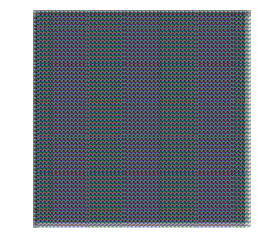

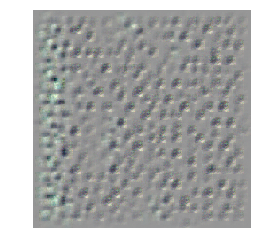

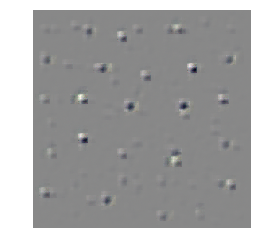

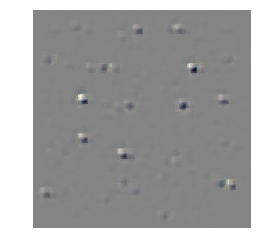

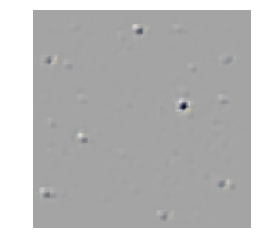

In [60]:
# Apply gradients to input image multiple times
# Get output saliency map of hard input image
from layer_activation_with_guided_backprop import GuidedBackprop
BP = GuidedBackprop(pretrained_net.network)
for filt in [l_i for l_i,l in enumerate(pretrained_net.network.features) if 'conv' in str(type(l))]:
    inputs=np.random.uniform(low=-0.5, high=0.5, size=(1,3,224,224)).astype(np.float16)
    inputs=torch.from_numpy(inputs).type(torch.FloatTensor)
    inputs.requires_grad=True
    filter_pos=np.argmax(iw_layer[filt])
#     print filter_pos
    #filter_pos=np.argmax0
    N=10
    for i in range(N):
        # Generate gradients
        gradient = BP.generate_gradients(inputs, 1, filt,filter_pos)
        img=inputs.detach().numpy()
        img+=10*gradient
        inputs=torch.from_numpy(img).type(torch.FloatTensor)
        inputs.requires_grad=True
    #     if i%5==0:
    img-=np.amin(img)
    img/=np.amax(img)
    # img=img+0.5
    plt.imshow(img[0].transpose(1,2,0))
    plt.axis('off')
#     plt.savefig('/users/visics/kkelchte/blogs/kkelchte.github.io/imgs/19-04-04_noise_scratch_iw_{0}.jpg'.format(filt),bbox_inches='tight')
    plt.show()
#     break

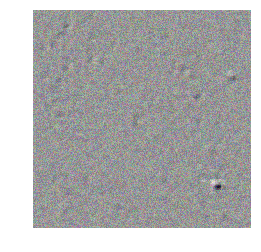

In [75]:
img-=np.amin(img)
img/=np.amax(img)
# img=img+0.5
plt.imshow(img[0].transpose(1,2,0))
plt.axis('off')
#         plt.savefig('/users/visics/kkelchte/blogs/kkelchte.github.io/imgs/19-04-04_dream_{0}.jpg'.format(int(i/25)),bbox_inches='tight')
plt.show()


In [145]:
[l_i for l_i,l in enumerate(pretrained_net.network.features) if 'conv' in str(type(l))]

[0, 3, 6, 8, 10]

In [52]:
# Select THE most important filter & layer and plot
K=3
thershold=0.1 #don't collect maps that are less important than 0.001

# Create saliency map with guided backpropagation
# inputs=torch.from_numpy(np.expand_dims(images[0],0)).type(torch.FloatTensor)
inputs=torch.from_numpy(np.expand_dims(hard_images[2],0)).type(torch.FloatTensor)
inputs.requires_grad=True
BP = GuidedBackprop(pretrained_net.network)

# extract correct layer indices
layer_indices=[l_i for l_i,l in enumerate(pretrained_net.network.features) if 'conv' in str(type(l))]

saliency_maps=[]
# fig,ax = plt.subplots(len(layer_indices),K, figsize=(10,15))
plt_index=0
for f_i, f_o in enumerate(filter_omegas):
    print len(f_o)
    top_f=np.asarray(f_o).argsort()[::-1] #most important
#     top_f=np.asarray(f_o).argsort()[:K] #least important
#     top_f=np.asarray(range(K)) #random
    try:
        cnn_layer=layer_indices[f_i]
    except:
        break
    for filter_pos in top_f:
        print(f_o[filter_pos])
        if f_o[filter_pos]<=thershold:
            break
        target=1
        # Generate gradients
        gradient = BP.generate_gradients(inputs, target, cnn_layer, filter_pos)
        gradient = gradient - gradient.min()
        gradient /= gradient.max()
        saliency_maps.append({'importance':f_o[filter_pos],'filter':filter_pos,'layer':cnn_layer,'map':gradient})
#         ax[plt_index/K, plt_index%K].imshow(np.swapaxes(gradient,0,1).swapaxes(1,2))
#         ax[plt_index/K, plt_index%K].set_axis_off()
#         plt_index+=1
# plt.show()
# plt.savefig('./gbsal_hard_rnd.png', bbox_inches='tight')


64
0.28814533
0.24082439
0.23683831
0.2181265
0.21058479
0.17624366
0.17179555
0.1591655
0.15023915
0.118048675
0.11255675
0.11201973
0.10670274
0.104604945
0.096326634
192
0.107319295
0.10074744
0.07866585
384
0.2492253
0.17814463
0.17348973
0.17308614
0.16494344
0.16487952
0.15404312
0.14930269
0.14814785
0.14662638
0.13691026
0.13406599
0.13401586
0.124348015
0.11798633
0.113288105
0.1015047
0.0970497
256
0.101608984
0.0786136
256
0.099096775
4096


layers: 0, filter: 62 importance: 0.288145333529


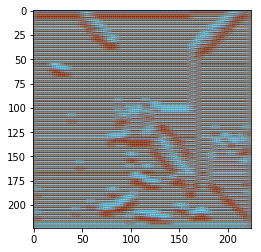

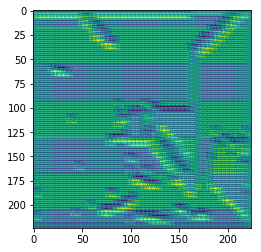

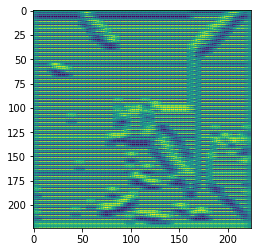

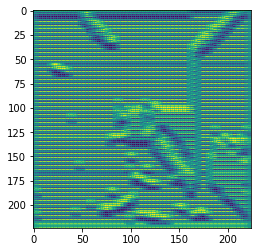

layers: 6, filter: 94 importance: 0.249225303531


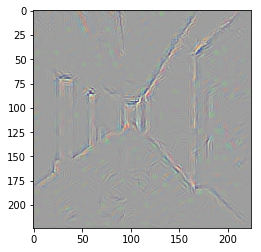

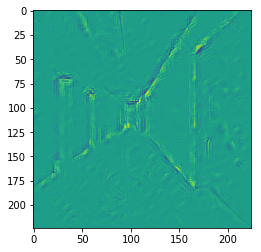

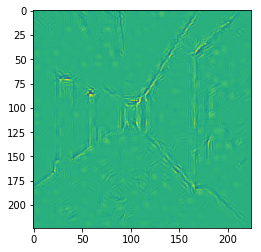

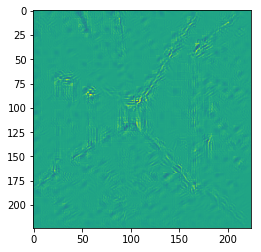

layers: 0, filter: 52 importance: 0.240824386477


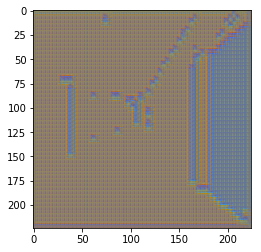

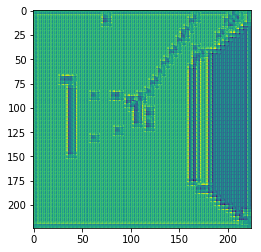

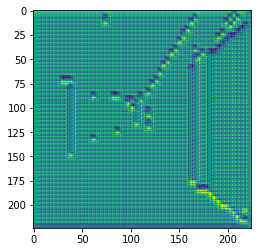

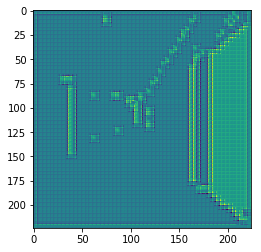

layers: 0, filter: 63 importance: 0.236838310957


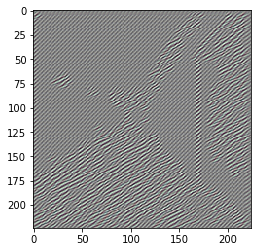

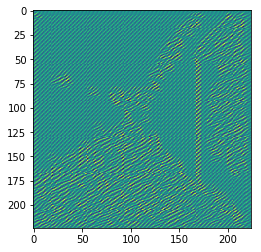

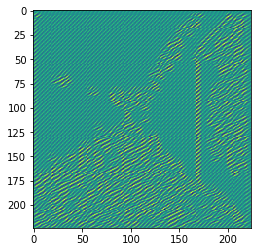

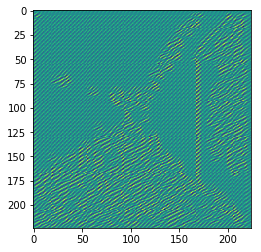

layers: 0, filter: 56 importance: 0.218126505613


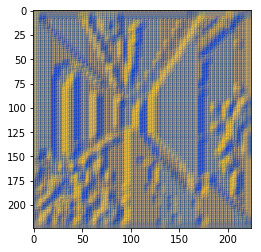

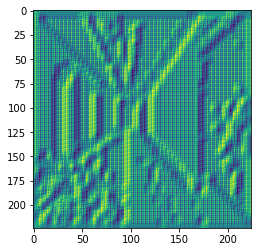

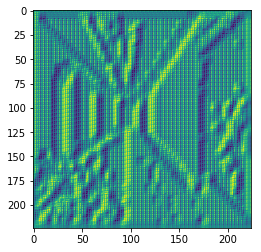

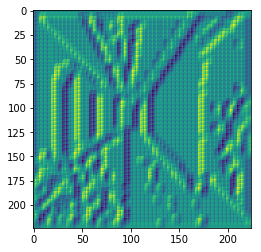

layers: 0, filter: 2 importance: 0.210584789515


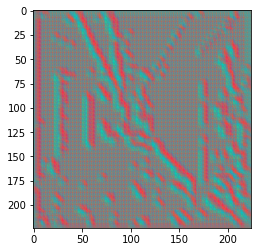

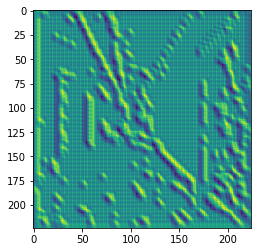

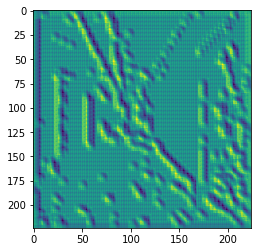

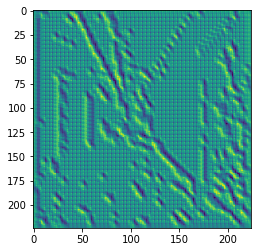

layers: 6, filter: 21 importance: 0.17814463377


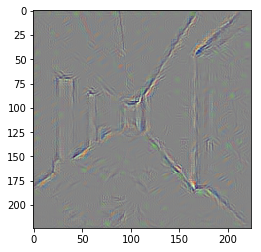

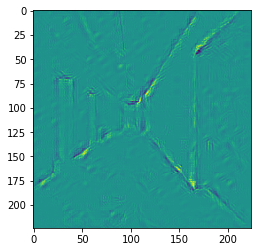

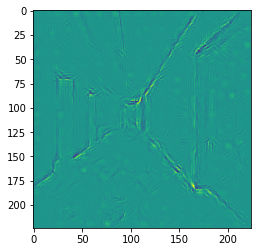

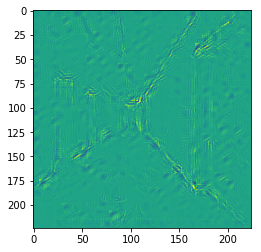

layers: 0, filter: 34 importance: 0.176243662834


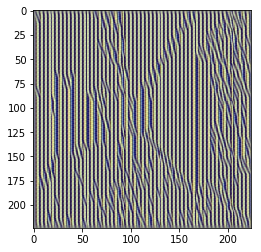

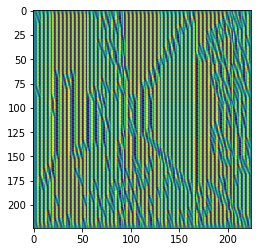

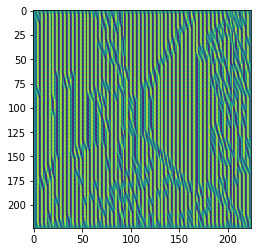

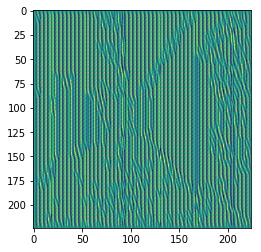

layers: 6, filter: 50 importance: 0.17348973453


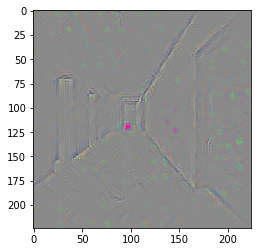

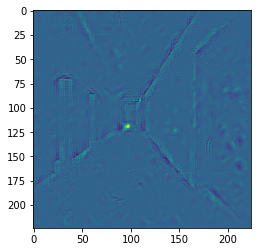

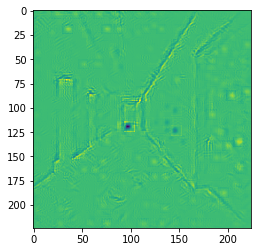

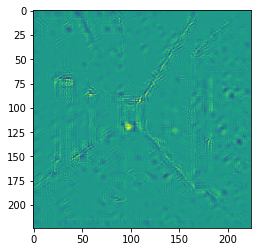

layers: 6, filter: 322 importance: 0.17308613658


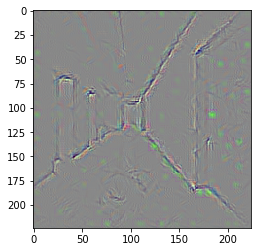

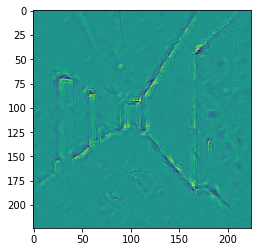

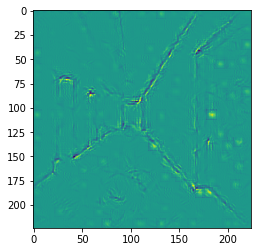

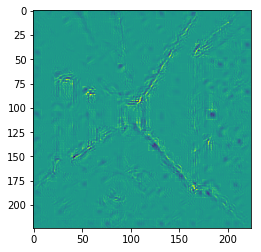

layers: 0, filter: 41 importance: 0.171795547009


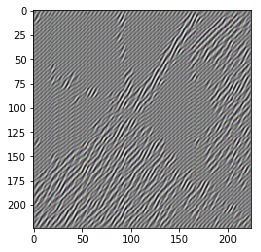

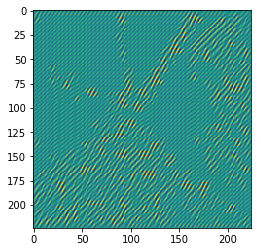

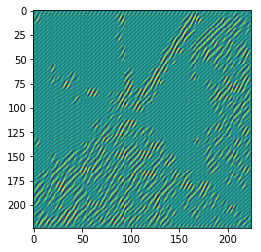

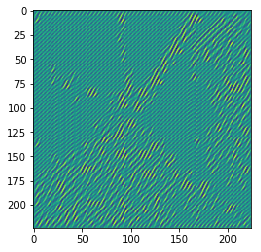

layers: 6, filter: 361 importance: 0.164943441749


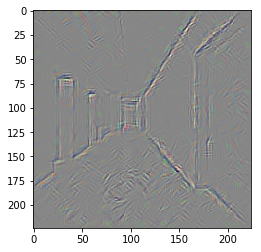

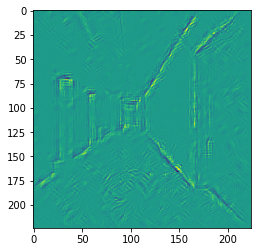

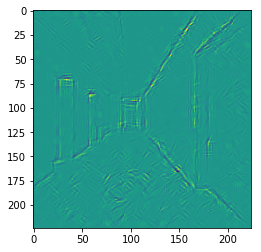

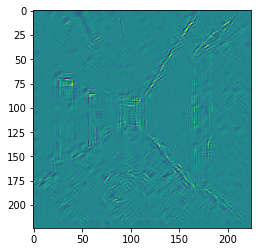

layers: 6, filter: 143 importance: 0.164879515767


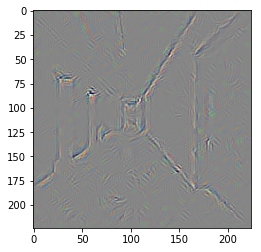

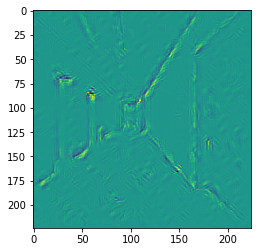

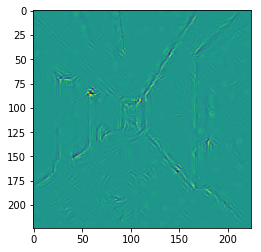

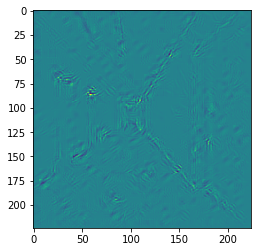

layers: 0, filter: 10 importance: 0.159165501595


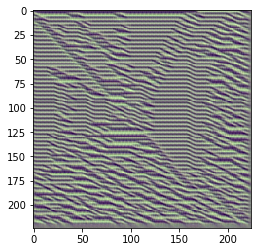

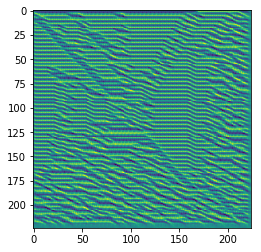

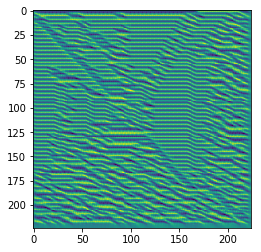

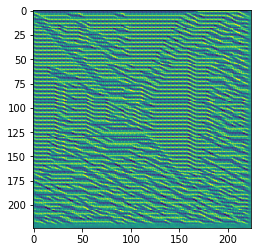

layers: 6, filter: 95 importance: 0.154043123126


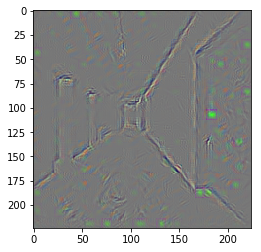

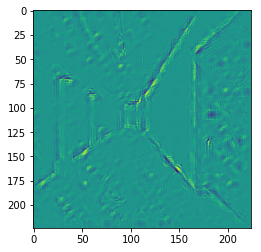

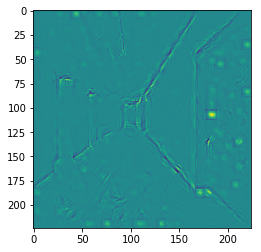

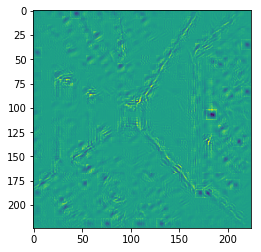

layers: 0, filter: 47 importance: 0.150239154696


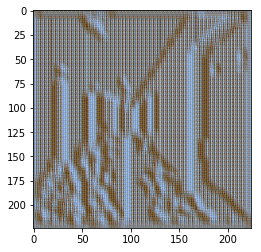

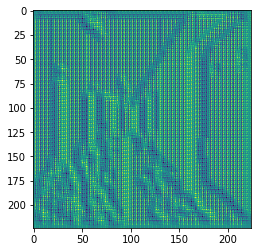

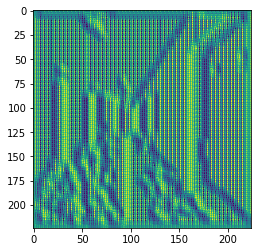

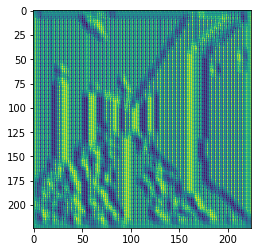

layers: 6, filter: 277 importance: 0.149302691221


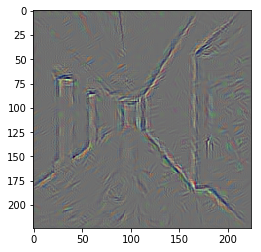

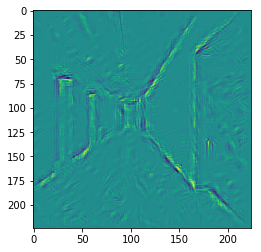

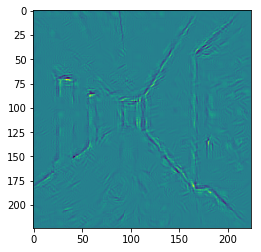

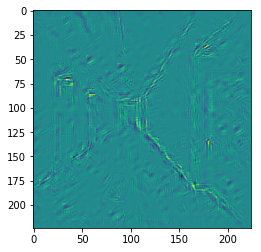

layers: 6, filter: 118 importance: 0.148147851229


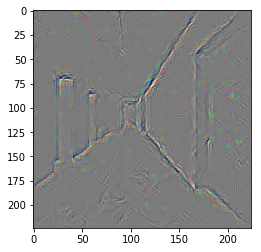

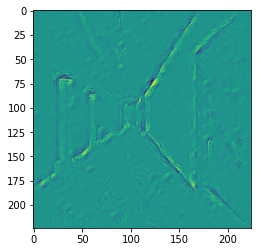

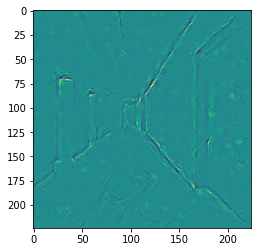

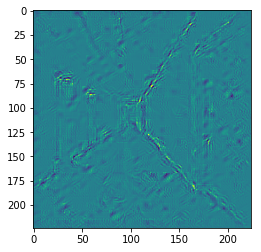

layers: 6, filter: 26 importance: 0.146626383066


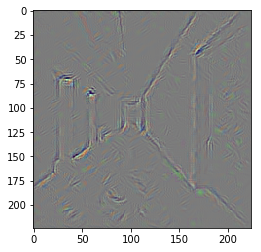

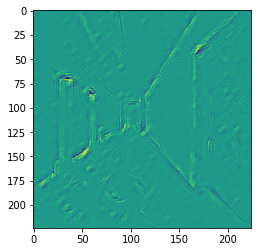

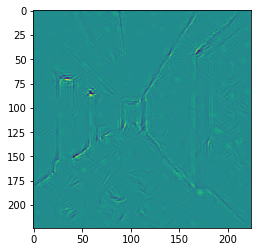

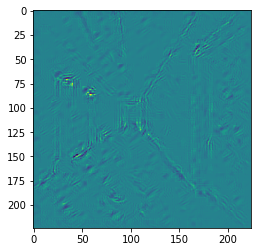

layers: 6, filter: 261 importance: 0.136910259724


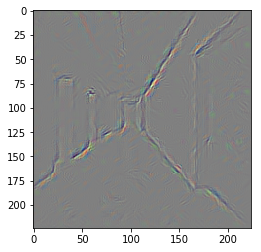

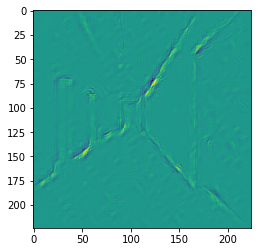

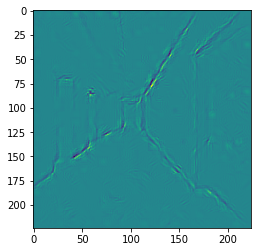

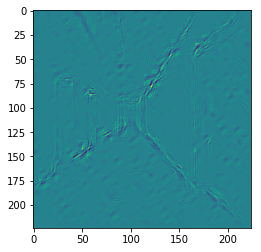

layers: 6, filter: 25 importance: 0.13406598568


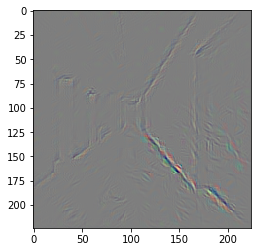

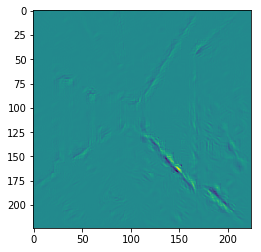

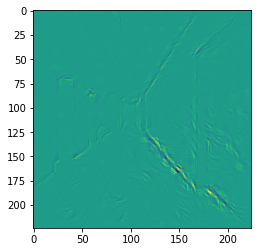

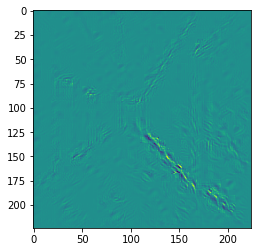

layers: 6, filter: 79 importance: 0.134015858173


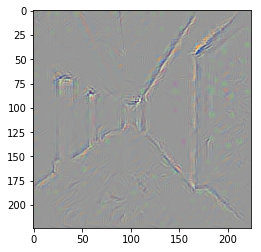

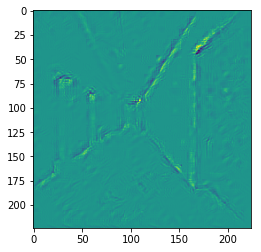

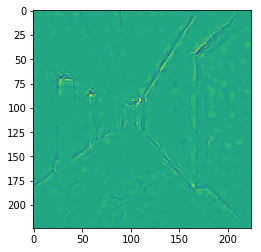

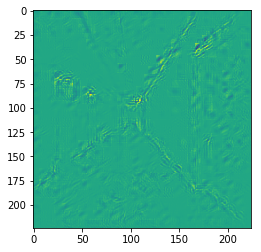

layers: 6, filter: 301 importance: 0.124348014593


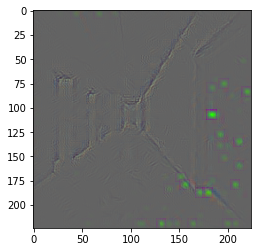

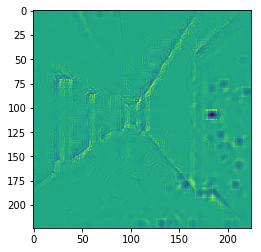

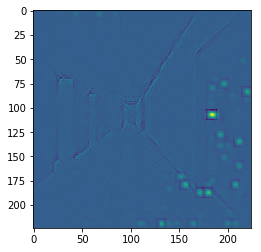

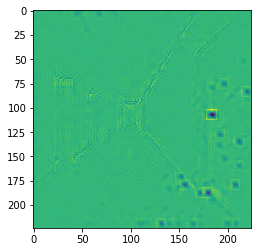

layers: 0, filter: 57 importance: 0.118048675358


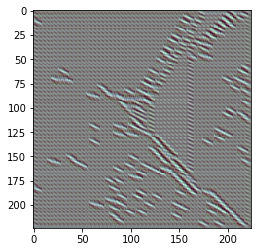

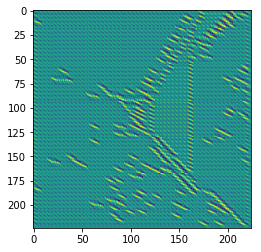

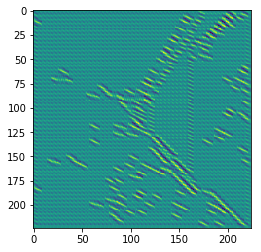

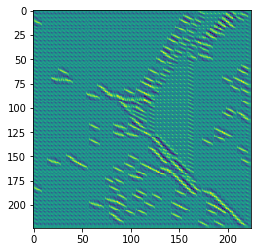

layers: 6, filter: 78 importance: 0.1179863289


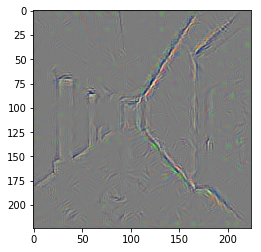

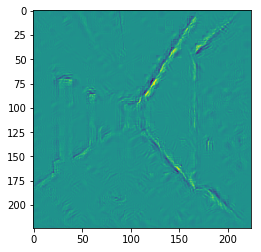

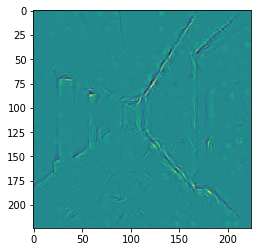

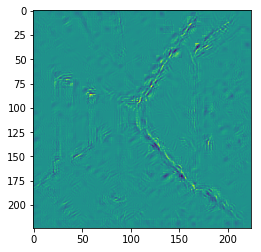

layers: 6, filter: 36 importance: 0.113288104534


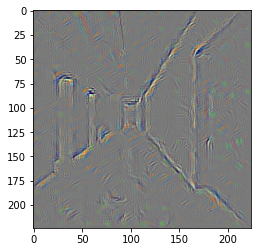

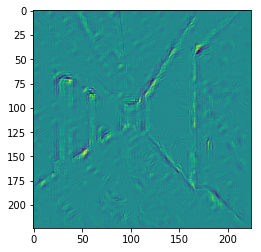

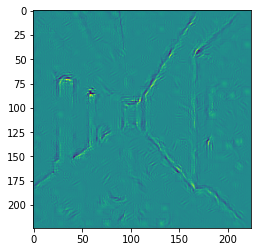

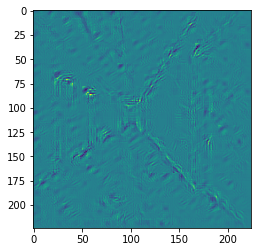

layers: 0, filter: 27 importance: 0.112556748092


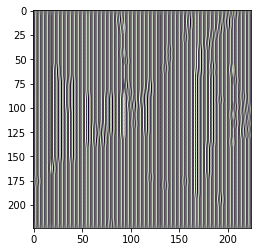

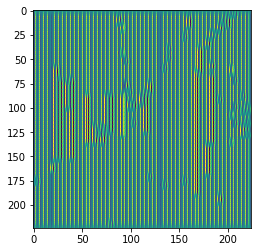

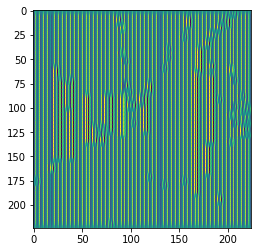

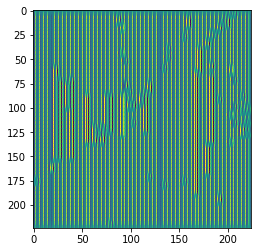

layers: 0, filter: 11 importance: 0.112019732594


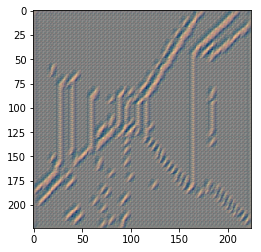

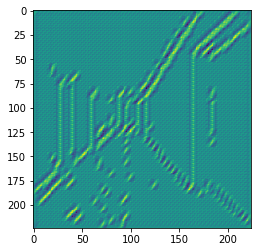

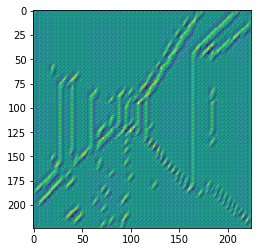

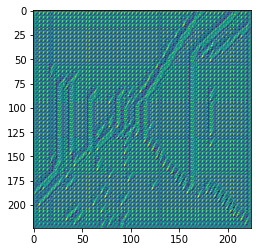

layers: 3, filter: 1 importance: 0.107319295406


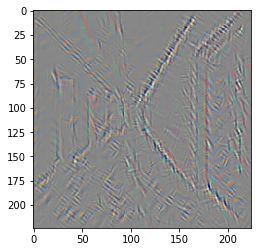

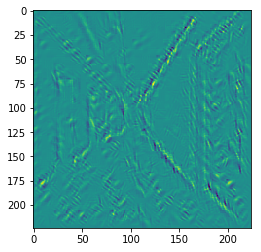

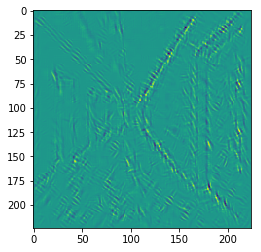

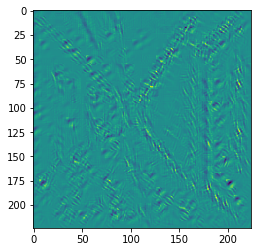

layers: 0, filter: 6 importance: 0.10670273751


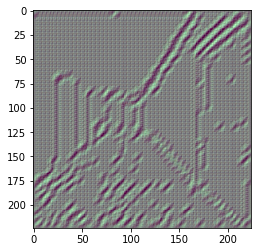

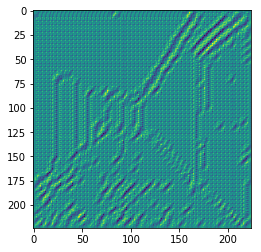

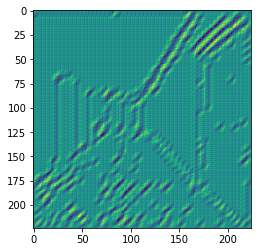

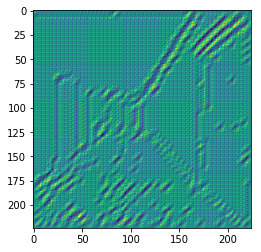

layers: 0, filter: 28 importance: 0.104604944587


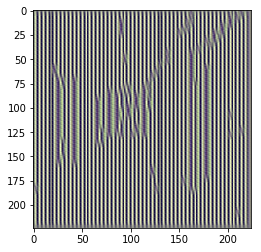

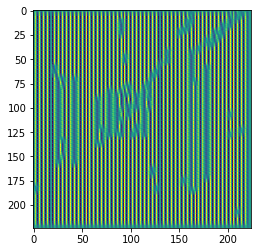

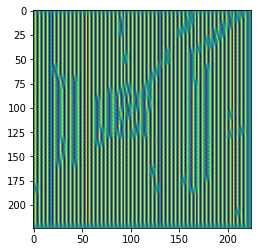

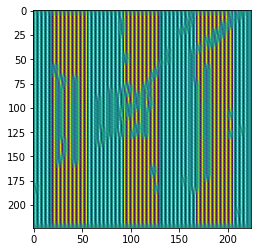

layers: 8, filter: 91 importance: 0.101608984172


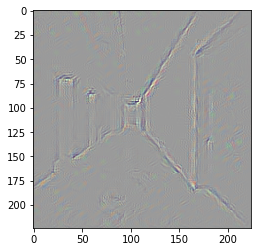

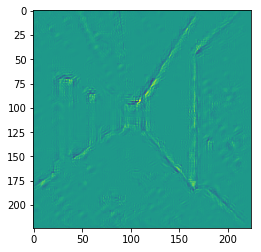

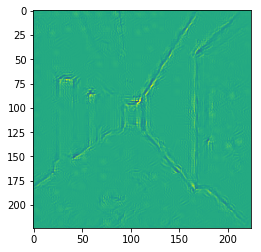

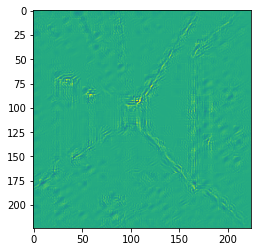

layers: 6, filter: 256 importance: 0.101504698396


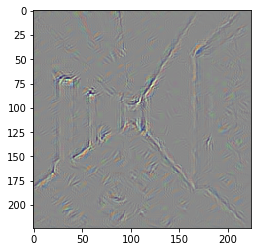

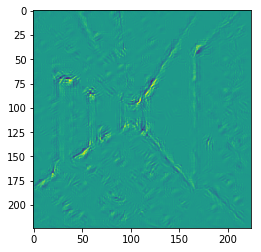

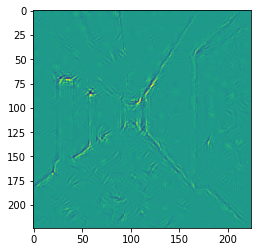

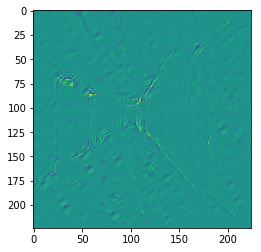

layers: 3, filter: 68 importance: 0.100747436285


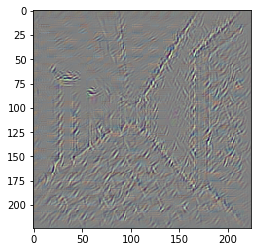

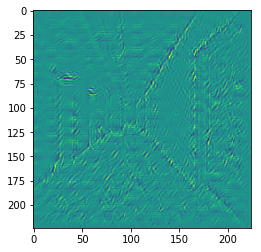

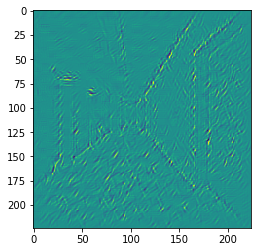

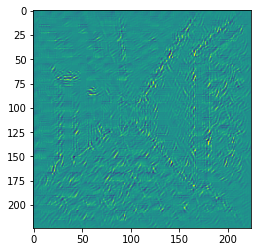

IndexError: list index out of range

In [58]:
saliency_maps=sorted(saliency_maps, key=lambda k: k['importance'])[::-1]

for g in range(50):
    print("layers: {0}, filter: {1} importance: {2}".format(saliency_maps[g]['layer'],saliency_maps[g]['filter'],saliency_maps[g]['importance']))
    plt.imshow(saliency_maps[g]['map'].transpose(1,2,0))
    plt.show()
#     plt.imshow(saliency_maps[g]['map'].transpose(1,2,0)[:,:,0]+0.5)
#     plt.show()
#     plt.imshow(saliency_maps[g]['map'].transpose(1,2,0)[:,:,1]+0.5)
#     plt.show()
#     plt.imshow(saliency_maps[g]['map'].transpose(1,2,0)[:,:,2]+0.5)
#     plt.show()

64
0.28814533
0.24082439
0.23683831
192
0.107319295
0.10074744
0.07866585
384
0.2492253
0.17814463
0.17348973
256
0.101608984
0.0786136
0.075314805
256
0.099096775
0.04897644
0.046660468
4096


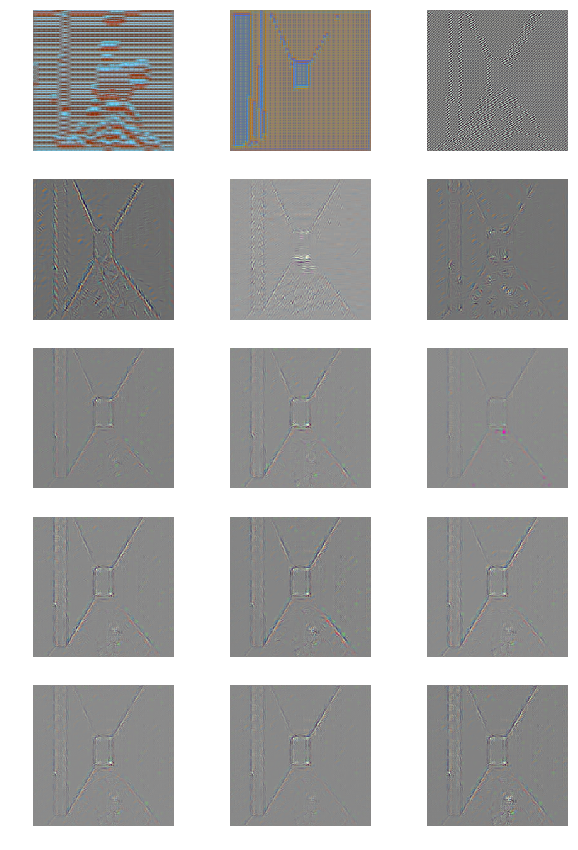

In [16]:
# Go over each layer and plot top K most important filters
K=3

# Create saliency map with guided backpropagation
# inputs=torch.from_numpy(np.expand_dims(images[0],0)).type(torch.FloatTensor)
inputs=torch.from_numpy(np.expand_dims(hard_images[0],0)).type(torch.FloatTensor)
inputs.requires_grad=True
BP = GuidedBackprop(pretrained_net.network)

# extract correct layer indices
layer_indices=[l_i for l_i,l in enumerate(pretrained_net.network.features) if 'conv' in str(type(l))]

fig,ax = plt.subplots(len(layer_indices),K, figsize=(10,15))
plt_index=0
for f_i, f_o in enumerate(filter_omegas):
    print len(f_o)
    top_f=np.asarray(f_o).argsort()[::-1][:K] #most important
#     top_f=np.asarray(f_o).argsort()[:K] #least important
#     top_f=np.asarray(range(K)) #random
    try:
        cnn_layer=layer_indices[f_i]
    except:
        break
    for filter_pos in top_f:
        print(f_o[filter_pos])
        target=1
        # Generate gradients
        gradient = BP.generate_gradients(inputs, target, cnn_layer, filter_pos)
        gradient = gradient - gradient.min()
        gradient /= gradient.max()
        ax[plt_index/K, plt_index%K].imshow(np.swapaxes(gradient,0,1).swapaxes(1,2))
        ax[plt_index/K, plt_index%K].set_axis_off()
        plt_index+=1
plt.show()
# plt.savefig('./gbsal_hard_rnd.png', bbox_inches='tight')

64
192
384
256
256
4096


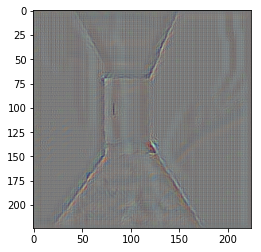

In [183]:
# Combine different images from different filters into one
# Go over each layer and plot top K most important filters
K=3

# Create saliency map with guided backpropagation
inputs=torch.from_numpy(np.expand_dims(images[0],0)).type(torch.FloatTensor)
inputs.requires_grad=True
BP = GuidedBackprop(pretrained_net.network)

# extract correct layer indices
layer_indices=[l_i for l_i,l in enumerate(pretrained_net.network.features) if 'conv' in str(type(l))]

combined_images=[]
weights=[]

plt_index=0
for f_i, f_o in enumerate(filter_omegas):
    print len(f_o)
    top_f=np.asarray(f_o).argsort()[::-1][:K] #most important
#     top_f=np.asarray(f_o).argsort()[:K] #least important
#     top_f=np.asarray(range(K)) #random
    try:
        cnn_layer=layer_indices[f_i]
    except:
        break
    for filter_pos in top_f:
        target=1
        # Generate gradients
        gradient = BP.generate_gradients(inputs, target, cnn_layer, filter_pos)
        gradient = gradient - gradient.min()
        gradient /= gradient.max()
        combined_images.append(gradient)
        weights.append(f_o[filter_pos])
#         if len(combined_image) != 0:
# #             combined_image+=gradient[:]
#             combined_image+=gradient[:]
#         else:
#             combined_image=gradient[:]
#         plt_index+=1

w = np.asarray(weights)
weights = np.exp(w-max(w))/sum(np.exp(w-max(w)))
combined_images=np.asarray(combined_images)
for i, img in enumerate(combined_images):
    img*=weights[i]
combined_image=np.sum(combined_images,axis=0)
plt.imshow(combined_image.transpose(1,2,0))
# plt.show()
plt.savefig('./gbsal_imagnetpretrained_combinedmax_weighted.png', bbox_inches='tight')

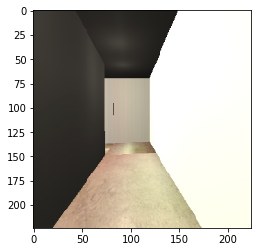

In [196]:
img=images[0][:]
img=img.transpose(1,2,0).astype(np.float32)
plt.imshow(img)
# plt.show()
plt.savefig('./original.png', bbox_inches='tight')

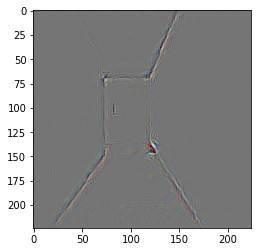

In [179]:
# Extraction of guided backpropagation saliency maps from output
from torch.nn import ReLU
from misc_functions import (get_example_params,
                            convert_to_grayscale,
                            save_gradient_images,
                            get_positive_negative_saliency)
# from vanilla_backprop import VanillaBackprop
from guided_backprop import GuidedBackprop

# Create saliency map with guided backpropagation
inputs=torch.from_numpy(np.expand_dims(images[0],0)).type(torch.FloatTensor)
inputs.requires_grad=True
# BP = VanillaBackprop(pretrained_net.network)
BP = GuidedBackprop(pretrained_net.network)
for i in range(3):
    # Generate gradients
    gradient = BP.generate_gradients(inputs, i)
    gradient = gradient - gradient.min()
    gradient /= gradient.max()
    plt.imshow(np.swapaxes(gradient,0,1).swapaxes(1,2))
#     plt.show()
plt.savefig('./gbsal_imagenetpretrained_output.png', bbox_inches='tight')

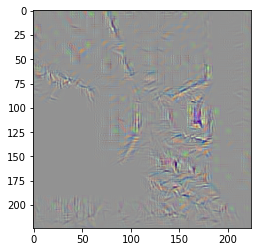

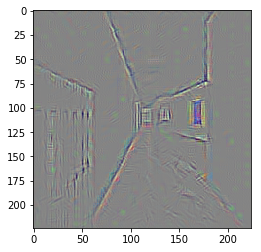

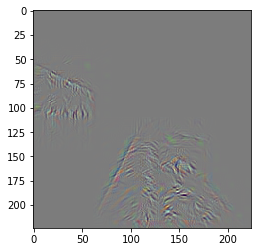

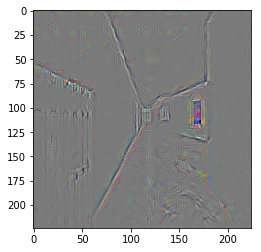

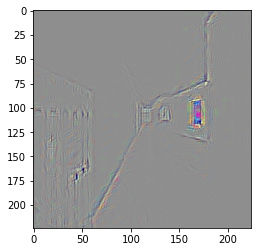

In [28]:
# Extraction of guided backpropagation saliency maps from output
from torch.nn import ReLU
from misc_functions import (get_example_params,
                            convert_to_grayscale,
                            save_gradient_images,
                            get_positive_negative_saliency)
# from vanilla_backprop import VanillaBackprop
from layer_activation_with_guided_backprop import GuidedBackprop

# Create saliency map with guided backpropagation
inputs=torch.from_numpy(np.expand_dims(images[0],0)).type(torch.FloatTensor)
inputs.requires_grad=True
# BP = VanillaBackprop(pretrained_net.network)
BP = GuidedBackprop(pretrained_net.network)

for cnn_layer in [5,6,7,8,9]:
    filter_pos=10
    i=1
    # Generate gradients
    gradient = BP.generate_gradients(inputs, i, cnn_layer, filter_pos)
    gradient = gradient - gradient.min()
    gradient /= gradient.max()
    plt.imshow(np.swapaxes(gradient,0,1).swapaxes(1,2))
    plt.show()

(64, 3, 11, 11)


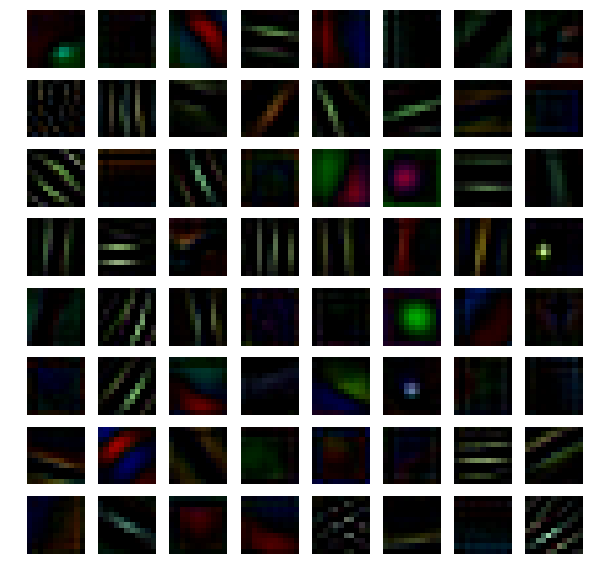

In [108]:
# DISPLAY FILTERS
filters=list(pretrained_net.parameters())[0].detach().numpy()

print filters.shape

fig,ax = plt.subplots(8,8, figsize=(10,10))
for i,f in enumerate(filters[:64]):
    f=np.swapaxes(f,0,1)
    f=np.swapaxes(f,1,2)
    ax[int(i/8.),i%8].imshow(f)
    ax[int(i/8.),i%8].set_axis_off()
plt.savefig('./filters.png', bbox_inches='tight')
# plt.show()

Sequential(
  (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
  (1): ReLU(inplace)
)
(1, 64, 55, 55)


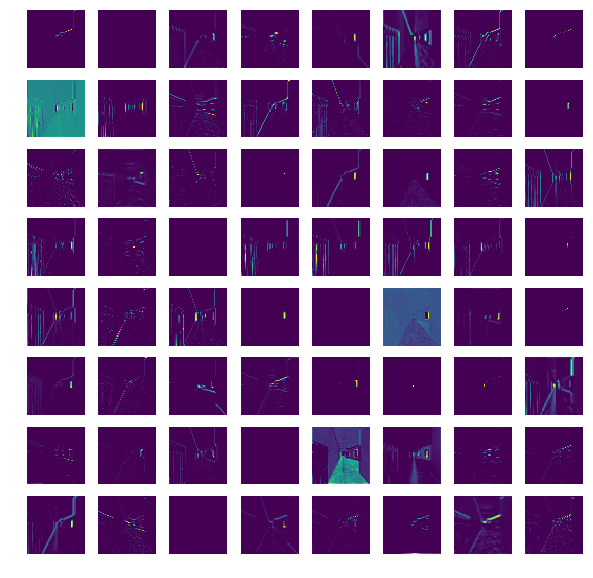

In [15]:
# DISPLAY FIRST 64 FEATURE MAPS/ACTIVATIONS OF NETWORK
# Get first layer feature activations (64 feature maps)
# inputs=torch.from_numpy(np.asarray(images)).type(torch.FloatTensor)
inputs=torch.from_numpy(np.expand_dims(images[0],0)).type(torch.FloatTensor)

# outputs=pretrained_net.network.features[3](inputs).detach().numpy()
bottommodel=nn.Sequential(*list(pretrained_net.network.children()))[0][:2]
print bottommodel
outputs=bottommodel(inputs).detach().numpy()
print outputs.shape

fig,ax = plt.subplots(8,8, figsize=(10,10))
for i,m in enumerate(outputs[0,:64]):
    ax[int(i/8.),i%8].imshow(m)
    ax[int(i/8.),i%8].set_axis_off()
plt.savefig('./activation_maps_2.png', bbox_inches='tight')

Sequential(
  (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
  (1): ReLU(inplace)
  (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (4): ReLU(inplace)
)
(1, 192, 27, 27)


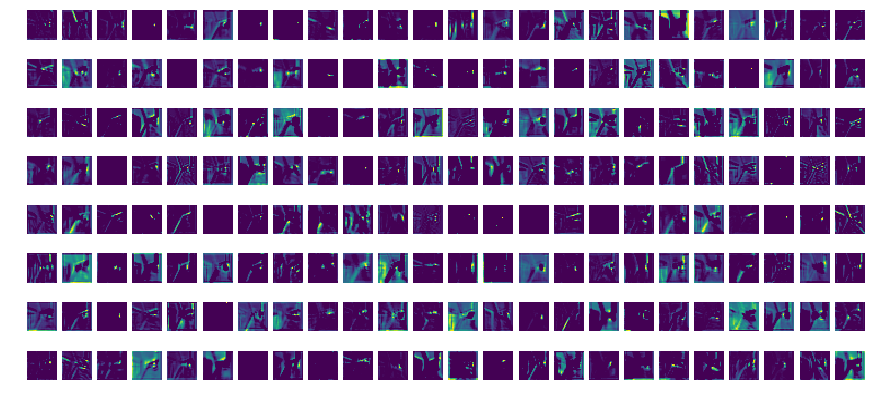

In [120]:
# DISPLAY FIRST 64 FEATURE MAPS/ACTIVATIONS OF NETWORK
# Get first layer feature activations (64 feature maps)
# inputs=torch.from_numpy(np.asarray(images)).type(torch.FloatTensor)
inputs=torch.from_numpy(np.expand_dims(images[0],0)).type(torch.FloatTensor)

# outputs=pretrained_net.network.features[3](inputs).detach().numpy()
bottommodel=nn.Sequential(*list(pretrained_net.network.children()))[0][:5]
print bottommodel
outputs=bottommodel(inputs).detach().numpy()
print outputs.shape

r=8
c=24

fig,ax = plt.subplots(r,c, figsize=(15,7))
for i,m in enumerate(outputs[0,:r*c]):
    ax[int(i/float(c)),i%c].imshow(m)
    ax[int(i/float(c)),i%c].set_axis_off()
plt.savefig('./activation_maps_5.png', bbox_inches='tight')
